# Task 3: Predictive Analysis

1. [Import libraries](#import-libraries)
2. [Loading dataset](#loading-dataset)
3. [Preprocessing for the classification task](#preprocessing)
    - [Preparing the label](#preparing-label)
    - [Dealing with unbalanceness](#unbalanceness)
    - [Test set and train set](#testtrain-set)
    - [Evaluation metrics and tools](#metrics-tools)
4. [Classification with Decision Tree](#decision-tree)
5. [Classification with Naive Bayes](#gaussian-naive-bayes)
6. [Classification with Random Forest](#random-forest)
7. [Classification with KNN](#knn)
8. [Classification with SVM](#svm)
9. [Classification with RIPPER](#ripper)
10. [Classification with NN](#nn)
11. [Ensemble of all models](#ensemble-models)
12. [Comparing the models](#compare-models)

## Importing libraries<a name="import-libraries"></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scikitplot as skplt
import pydotplus 
import tensorflow as tf
import wittgenstein as lw
import imblearn
import warnings

from IPython.display import Image  

from scipy.stats import randint as sp_randint

from sklearn import tree, metrics
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split
from sklearn.metrics import classification_report, plot_confusion_matrix, make_scorer, accuracy_score, precision_score, recall_score
from sklearn.datasets import make_blobs
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.neural_network import MLPClassifier

from imblearn.over_sampling import RandomOverSampler

from yellowbrick.classifier import ClassificationReport, ConfusionMatrix, ClassPredictionError, ROCAUC, PrecisionRecallCurve
from yellowbrick.model_selection import FeatureImportances

from mlxtend.plotting import plot_decision_regions

## Loading the datasets<a name="loading-dataset"></a>

In [2]:
df_new_num = pd.read_csv('data/df_new_num.csv', index_col=0) #all numerical features
df_all = pd.read_csv('data/df_new_all.csv', index_col=0) #all features

In [3]:
df_new_num

,rank,ht,age,tourPlayed,maxAceSvpt,avgDfSvpt,1sv2svWon,bpS_bpF,win_ratio
0,1398.00,186.54,24.0,5,6.03,6.95,57.24,61.81,18.18
1,436.00,173.92,26.0,5,3.06,7.32,49.14,41.58,0.00
2,918.00,186.54,21.0,5,4.06,4.72,59.64,61.79,46.67
3,493.22,173.92,37.0,8,3.52,4.41,53.44,48.60,0.00
4,530.00,173.92,26.0,12,0.76,5.11,52.57,55.29,57.14
...,...,...,...,...,...,...,...,...,...
1966,191.00,186.54,22.0,25,2.75,2.99,62.20,56.99,63.64
1967,611.00,173.92,22.0,8,2.33,4.63,56.17,56.24,47.06
1968,435.00,173.92,16.0,6,1.47,9.59,40.77,36.56,14.29
1969,347.00,186.54,21.0,34,2.54,3.56,56.34,51.41,54.65


## Preprocessing for the classification task<a name="preprocessing"></a>

### Preparing the label<a name="preparing-label"></a>

The target label will have value 0 if the player is a low skilled player or 1 otherwise. The value 1 is assigned arbitrarily for the players in the top 15 percentile, which roughly correspond to the top 100 rank players.

In [4]:
qnt_rank = df_new_num['rank'].quantile(0.15)
print(qnt_rank)

125.10499999999999


We set the label in the dataframe

In [5]:
df_new_num['rank'] = df_new_num['rank'].apply(lambda x: 1 if (x < qnt_rank) else 0 )

In [6]:
label = df_new_num.pop('rank')

### Dealing with unbalanceness<a name="unbalanceness"></a>

Since our dataset is heavily unbalanced, in fact 15% of the dataset has value 1 and the rest the value 0, we will need to balance it by oversampling, i.e. we will increase the number of positive (label=1) instances.<br> 
This will help in the classification task to avoid low recall value and cases where the accuracy is extremely high since it tends to be a one target classifier (almost like a classifier that gives always the same answer).

In [7]:
oversample = RandomOverSampler(sampling_strategy=0.8, random_state = 69)
df_new_num, label = oversample.fit_resample(df_new_num, label)

Right now we have 55,5% of positive instances and 44,5% of negative instances (label=0) 

In [8]:
label.value_counts(True)

0    0.555556
1    0.444444
Name: rank, dtype: float64

### Test set and train set<a name="testtrain-set"></a>

We split the dataset into train and test set, the partition is 80% for the former and 20% for the latter. The test set will help us estimate the generalization error in the final step of model evaluation, the validation set is implicitly used in the grid search and it correspond to 20% of the training set.

In [9]:
train_set, test_set, train_label, test_label = train_test_split(df_new_num, label, stratify=label, test_size=0.2,  random_state=69)

### Evaluation metrics and tools<a name="metrics-tools"></a>

In [10]:
classes = ['low skilled', 'high skilled']

In [11]:
#utility function used to report the scores of the model
def report_scores(model, label, pred):
    report = classification_report(label, 
                            pred, 
                            target_names=['low skilled', 'high skilled'])
    print(f"\t\t----{model}----")
    print(report)
    return {model: report}

train_results = []
test_results = []

In [12]:
#utility function used to plot the report of the model
def plot_report(model):
    cr_visualizer = ClassificationReport(model, classes=classes, support='percent')
    cr_visualizer.fit(train_set, train_label)
    cr_visualizer.score(test_set, test_label)
    cr_visualizer.finalize()

In [13]:
#utility function used to plot the confusion matrix and the class prediction error (plot showing the number of training samples
#that have been misclassified according to the class)
def plot_cm_cp(model):
    f, axes = plt.subplots(1, 2, figsize=(15, 7))
    f.tight_layout()
    
    cm_visualizer = ConfusionMatrix(
        model, classes=classes,
        percent=True,
        ax=axes[0]
    )
    cm_visualizer.fit(train_set, train_label)
    cm_visualizer.score(test_set, test_label)
    cm_visualizer.finalize();

    cpe_visualizer = ClassPredictionError(model, classes=classes, is_fitted=True, ax=axes[1])
    cpe_visualizer.score(test_set, test_label)
    cpe_visualizer.finalize();

In [14]:
#utility function used to plot the feature importance for every attribute (used only for the decision tree and random forest model)
def plot_feature_importance(model):
    fi_visualizer = FeatureImportances(model, relative=False)
    fi_visualizer.fit(train_set, train_label)
    fi_visualizer.finalize();

In [15]:
#utility function used to plot the ROC (Receiver Operating Characteristic) curve
def plot_ROC(model, ax=None):
    roc_visualizer = ROCAUC(model, classes=classes, ax=ax)
    roc_visualizer.fit(train_set, train_label)
    roc_visualizer.score(test_set, test_label)       
    roc_visualizer.show()   

In [16]:
#utility function used to plot the decision regions of the model using the combination of a pair of attributes at a time
feature_pairs = [[fa, fb] for idx, fa in enumerate(train_set.columns) for fb in train_set.columns[idx + 1:]]

def plot_decision_region(model):
    fig, axes = plt.subplots(4, 7, figsize=(25, 15))
    fig.tight_layout()

    row=0
    col=0

    for p in feature_pairs:
        model = model.fit(train_set[p], train_label) 
        plot_decision_regions(train_set[p].values, 
                                train_label.values, 
                                clf=model, 
                                legend=2,
                                ax=axes[row][col])

        axes[row][col].set_xlabel(p[0])
        axes[row][col].set_ylabel(p[1])

        handles, labels = axes[row][col].get_legend_handles_labels()
        axes[row][col].legend(handles, 
          ['low skilled', 'high skilled'], 
           framealpha=0.3, scatterpoints=1)

        row = (row + 1) % 4
        col = (col + 1) % 7

In [17]:
#trains the neural network one epoch at a time and it computes a list of training and test scores using accuracy score
def fit_and_score(epochs, eval_model, X_train, y_train, X_test, y_test):
    train_scores = []
    test_scores = []
    for i in range(epochs):
        eval_model = eval_model.partial_fit(X_train,y_train, np.unique(y_train))
        y_train_predicted = eval_model.predict(X_train)
        y_test_predicted = eval_model.predict(X_test)
        train_scores.append(accuracy_score(y_train, y_train_predicted))
        test_scores.append(accuracy_score(y_test, y_test_predicted))
    return train_scores, test_scores

In [18]:
#utility function used to plot the learning curve for the neural network 
def plot_learning_curves(train_scores, test_scores, epochs, y_label):
    plt.figure(figsize=(10,8))
    plt.plot(range(0,epochs), train_scores, label = "Training error", linestyle='dashed')
    plt.plot(range(0,epochs), test_scores, label = "Test error")
    plt.legend()
    plt.ylabel(y_label)
    plt.xlabel('Epoch');

## Classification with Decision Tree<a name="decision-tree"></a>

The first model we explore is the decision tree classifier, this supervised model is used to predict the target (in this case if the tennis player is high or low skilled) of the instances using simple decision rules. The main advantage of this model is its inherent explainability and simplicity.

### Hyperparameters tuning using the grid search
We perform an initial grid search with sparser values which will give us a more "interesting" range of values to explore in a second grid search

In [19]:
dt_max_depth = [3, 4, 5, 6, 7, 8, 16, 32, 64]
dt_min_samples_split = range(2, 8)
min_samples_leaf = range(2, 8)
criterion = ["entropy", "gini"]
splitter = ["best", "random"]
random_state= [69]
k=10
dt_params_grid = {
    "max_depth": dt_max_depth,
    "min_samples_split": dt_min_samples_split,
    "min_samples_leaf": min_samples_leaf,
    "criterion": criterion,
    "splitter": splitter,
    "random_state": random_state,
}

After we selected some values for the hyperparameters we perform the grid search which uses a cross validation k-fold to perform the model selection, in our case we chose to use 10-folds cross validation.

In [20]:
%%script false --no-raise-error

dt_grid = GridSearchCV(DecisionTreeClassifier(), param_grid=dt_params_grid, cv=k)
dt_grid.fit(train_set, train_label)

In [21]:
%%script false --no-raise-error

best_params = dt_grid.best_params_
print('Best parameters setting ', best_params)

In [22]:
%%script false --no-raise-error

df_results = pd.DataFrame(data=dt_grid.cv_results_)
df_results.sort_values(by="rank_test_score", inplace=True)
df_results = df_results[:20]

In [23]:
%%script false --no-raise-error

df_results

We create a dataclass to store the optimal values of the grid search, these values will be used to perform the next more accurate grid search.

In [24]:
%%script false --no-raise-error

from dataclasses import dataclass

@dataclass
class GridSearchRangesDT:
    '''Class of keeping track of the min and max values for the hyperparameters tuning'''
    
    min_depth = 0
    max_depth = 0
    min_samples_leaf = 0
    max_samples_leaf = 0
    min_samples_split = 0
    max_samples_split = 0
    
    def set_ranges(self):

        self.min_depth = np.min(df_results['param_max_depth'])
        self.max_depth = np.max(df_results['param_max_depth'])
        print(f"Max depth: [{self.min_depth}, {self.max_depth}]")
    
        self.min_samples_leaf = np.min(df_results['param_min_samples_leaf'])
        self.max_samples_leaf = np.max(df_results['param_min_samples_leaf'])
        print(f"Min samples leaf: [{self.min_samples_leaf}, {self.max_samples_leaf}]")    
        
        self.min_samples_split = np.min(df_results['param_min_samples_split'])
        self.max_samples_split = np.max(df_results['param_min_samples_split'])
        print(f"Min samples split: [{self.min_samples_split}, {self.max_samples_split}]")            
    

In [25]:
%%script false --no-raise-error

gs_ranges = GridSearchRangesDT()
gs_ranges.set_ranges()

In [26]:
%%script false --no-raise-error

dt_max_depth = range(gs_ranges.min_depth, gs_ranges.max_depth)
if gs_ranges.min_samples_leaf != gs_ranges.max_samples_leaf:
    min_samples_leaf = range(gs_ranges.min_samples_leaf,gs_ranges.max_samples_leaf)
else:
    min_samples_leaf = [gs_ranges.min_samples_leaf]
if gs_ranges.min_samples_split != gs_ranges.max_samples_split:
    dt_min_samples_split = range(gs_ranges.min_samples_split,gs_ranges.max_samples_split)
else:
    dt_min_samples_split = [gs_ranges.min_samples_split]

criterion = ["entropy", "gini"]
splitter = ["best", "random"]
random_state= [69]

dt_params_grid = {
    "max_depth": dt_max_depth,
    "min_samples_split": dt_min_samples_split,
    "min_samples_leaf": min_samples_leaf,
    "criterion": criterion,
    "splitter": splitter,
    "random_state": random_state,
}

In [27]:
%%script false --no-raise-error

dt_grid = GridSearchCV(DecisionTreeClassifier(), param_grid=dt_params_grid, cv=k)
dt_grid.fit(train_set, train_label)

In [28]:
%%script false --no-raise-error

df_results = pd.DataFrame(data=dt_grid.cv_results_)
df_results.sort_values(by="rank_test_score", inplace=True)
df_results = df_results[:50]
pd.DataFrame.to_csv(df_results, "grid_search_results/dt_grid_search.csv")

The results of the model selection are gathered in a dataframe which is sorted using the mean error on the 10 folds, i.e. validation error.

In [29]:
df_results = pd.read_csv("grid_search_results/dt_grid_search.csv")
df_results.head()

,Unnamed: 0,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,param_random_state,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0,0.016860,0.002752,0.001871,0.000195,entropy,16,2,2,69,...,0.912863,0.933610,0.946058,0.929461,0.937759,0.925311,0.925311,0.923307,0.015174,1
1,2,0.016230,0.002910,0.001902,0.000220,entropy,16,2,3,69,...,0.912863,0.933610,0.946058,0.929461,0.937759,0.925311,0.925311,0.923307,0.015174,1
2,4,0.019997,0.002814,0.002520,0.000511,entropy,16,2,4,69,...,0.912863,0.933610,0.946058,0.929461,0.937759,0.925311,0.925311,0.923307,0.015174,1
3,360,0.017075,0.003093,0.001941,0.000315,entropy,52,2,2,69,...,0.908714,0.925311,0.941909,0.929461,0.937759,0.925311,0.925311,0.921645,0.014988,4
4,100,0.021169,0.002873,0.002895,0.000698,entropy,26,2,2,69,...,0.908714,0.925311,0.941909,0.929461,0.937759,0.925311,0.925311,0.921645,0.014988,4


In [30]:
%%script false --no-raise-error

best_params = dt_grid.best_params_
print('Best parameters setting ', best_params)

### Model evaluation for Decision Tree

We choose the best estimator given by the cv performed and we fit it using the training set (we do this even though the GridSearch already refits the best estimator)

In [31]:
#define a decision tree and fit it
#dt = dt_grid.best_estimator_
dt = DecisionTreeClassifier(criterion = 'entropy', max_depth = 16, min_samples_leaf = 2, min_samples_split = 2, random_state = 69, splitter = 'best')

dt = dt.fit(train_set, train_label) 

We plot the decision tree and observe that first split happens based on the win ratio, which is logically one of the most important feature to classify an high skilled player from a low skilled player.

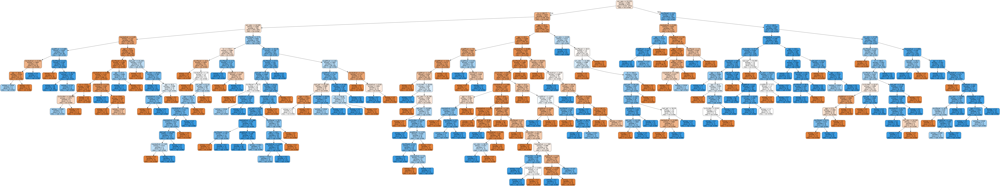

In [32]:
#visualize the actual decision tree obtained 
dot_data = export_graphviz(dt, out_file=None, 
                         feature_names=list(train_set.columns),  
                         class_names=['low skilled', 'high skilled'],  
                         filled=True, rounded=True)  
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

In [33]:
#predict using the decision tree
#the predict function returns the actual predicted labels: we need them for the evaluation phase
train_pred_dt = dt.predict(train_set)
test_pred_dt = dt.predict(test_set)

After fitting the model, most classifiers (e.g. Decision Tree, Random Forest etc.) provide us the attribute `feature_importances_` that can be used to rank and plot relative importances of each attribute. We can observe that win `ratio`, `tourPlayed` and `maxAceSvpt` are the most important features used for the classification task.

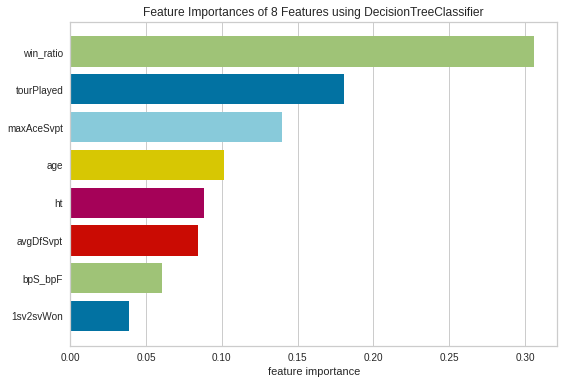

In [34]:
warnings.filterwarnings('ignore')

plot_feature_importance(dt)

### Evaluation of the decision tree: compute accuracy, precision, recall, confusion matrix

In [35]:
#evaluate the accuracy on the train set and the test set
#metrics also contains precision, recall, f1 and the support

print('Accuracy train set ', metrics.accuracy_score(train_label, train_pred_dt))
print('Accuracy test set ', metrics.accuracy_score(test_label, test_pred_dt))

print('Precision train set ', metrics.precision_score(train_label, train_pred_dt, average='weighted'))
print('Recall train set ', metrics.recall_score(train_label, train_pred_dt, average='weighted'))

print('F1 score train set ', metrics.f1_score(train_label, train_pred_dt, average='weighted'))
print('Support train set ', metrics.precision_recall_fscore_support(train_label, train_pred_dt))

Accuracy train set  0.99212271973466
Accuracy test set  0.9369817578772802
Precision train set  0.9921721587773376
Recall train set  0.99212271973466
F1 score train set  0.9921265914753051
Support train set  (array([0.99699022, 0.98614958]), array([0.98880597, 0.99626866]), array([0.99288123, 0.99118329]), array([1340, 1072]))


We report the scores for the decision tree model, the accuracy on the training set is 99% whereas on the test set we have 94% of accuracy.
It is evident that the precision for the high skilled players (89%) and the recall on low skilled players (90%) is quite low, these two values tend to be low also in the other models.

In [36]:
# score on train set
report = report_scores("Decision Tree", train_label, train_pred_dt)
train_results.append(report)

		----Decision Tree----
              precision    recall  f1-score   support

 low skilled       1.00      0.99      0.99      1340
high skilled       0.99      1.00      0.99      1072

    accuracy                           0.99      2412
   macro avg       0.99      0.99      0.99      2412
weighted avg       0.99      0.99      0.99      2412



In [37]:
# score on test set
report = report_scores("Decision Tree", test_label, test_pred_dt)
test_results.append(report)

		----Decision Tree----
              precision    recall  f1-score   support

 low skilled       0.98      0.90      0.94       335
high skilled       0.89      0.98      0.93       268

    accuracy                           0.94       603
   macro avg       0.94      0.94      0.94       603
weighted avg       0.94      0.94      0.94       603



The Precision-Recall Curve shows the tradeoff between a classifier's precision and recall. For each class, precision is defined as the ratio of true positives to the sum of true and false positives, and recall is the ratio of true positives to the sum of true positives and false negatives.

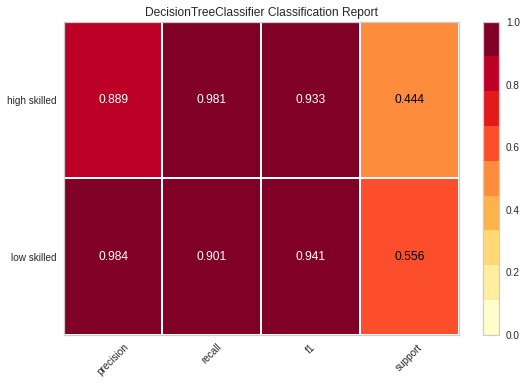

In [38]:
plot_report(dt)

We can also plot the decision regions that were defined by the classifier. To do so we define another Decision Tree classifier with the same hyperparameters but we fit it considering each pair of attributes.

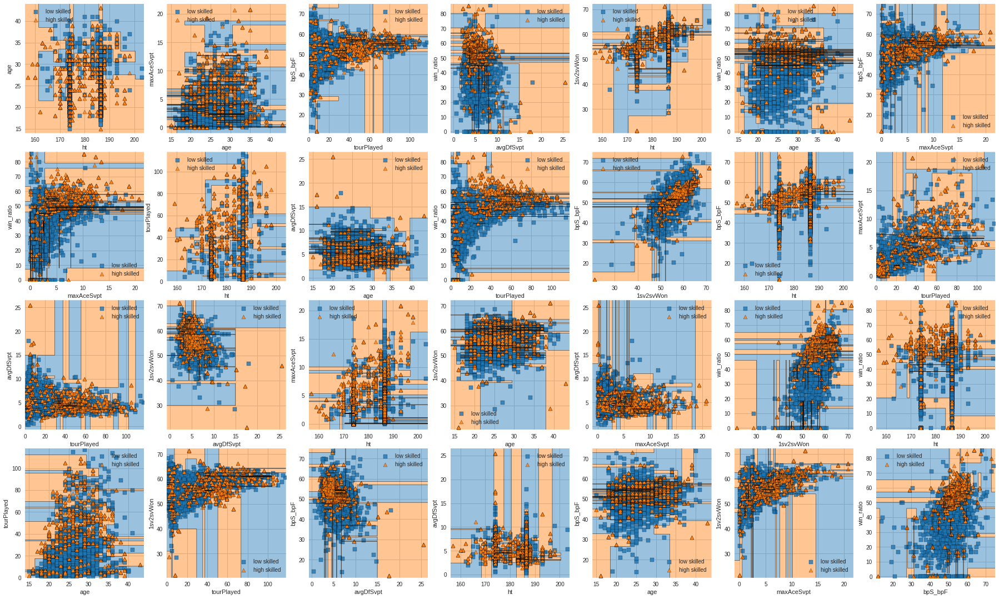

In [39]:
dt_dr = DecisionTreeClassifier(criterion = 'entropy', max_depth = 16, min_samples_leaf = 2, min_samples_split = 2, random_state = 69, splitter = 'best')

plot_decision_region(dt_dr)

The class prediction error plot shows the support (number of training samples) for each class in the fitted classification model as a stacked bar chart. Each bar is segmented to show the proportion of predictions (including false negatives and false positives, like a Confusion Matrix) for each class.
The confusion matrix shows also that the high number of misclassified low skilled players as high skilled (10%) is the cause of the low precision and recall seen before. This happens in almost all the models that we explored.

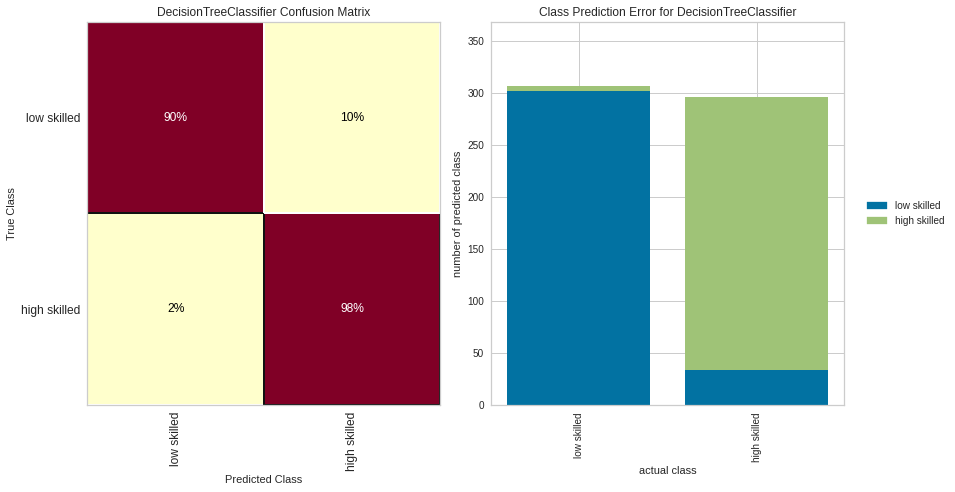

In [40]:
plot_cm_cp(dt)

We also plot the ROC curve which plots the True Positive on the y-axis against the False Positive on x-axis and the AUC (Area Under Curve) value, in this case we obtain AUC = 0.95

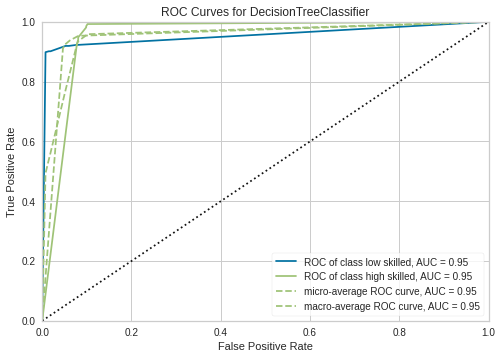

In [41]:
plot_ROC(dt)

## Classification with Naive Bayes<a name="gaussian-naive-bayes"></a>

Next we try the Naive Bayes classifier which uses the conditional probability to estimate the outcome, the assumption is that attributes are conditionally independent given the class label of the target. We suspect that this is not the case for our dataset but we try the model anyway to confirm it.

In [42]:
gnb = GaussianNB()
gnb.fit(train_set, train_label)

GaussianNB()

### Model evaluation

As we suspected the model performed poorly with only 80% of accuracy on the training set and 77% accuracy on the test set.

In [43]:
#predict on training set
train_pred_gnb = gnb.predict(train_set)

report = report_scores("Gaussian Naive Bayes", train_label, train_pred_gnb)
train_results.append(report)

		----Gaussian Naive Bayes----
              precision    recall  f1-score   support

 low skilled       0.82      0.81      0.82      1340
high skilled       0.77      0.78      0.78      1072

    accuracy                           0.80      2412
   macro avg       0.80      0.80      0.80      2412
weighted avg       0.80      0.80      0.80      2412



In [44]:
#predict on the test set
test_pred_gnb = gnb.predict(test_set)

#compute the performance of the model
report = report_scores("Gaussian Naive Bayes", test_label, test_pred_gnb)
test_results.append(report)

		----Gaussian Naive Bayes----
              precision    recall  f1-score   support

 low skilled       0.79      0.80      0.79       335
high skilled       0.74      0.74      0.74       268

    accuracy                           0.77       603
   macro avg       0.77      0.77      0.77       603
weighted avg       0.77      0.77      0.77       603



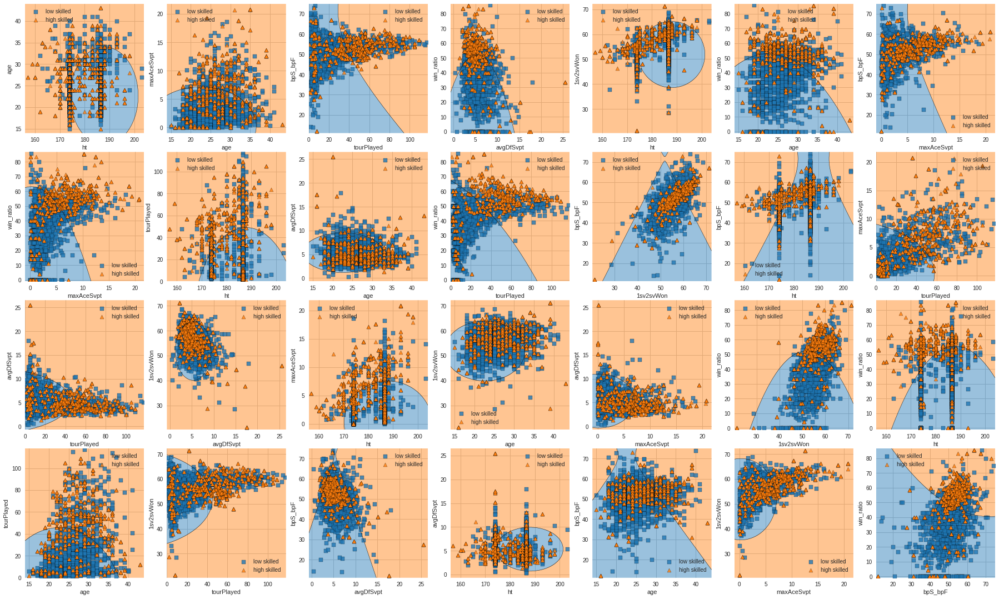

In [45]:
gnb_dr = GaussianNB()
plot_decision_region(gnb_dr)

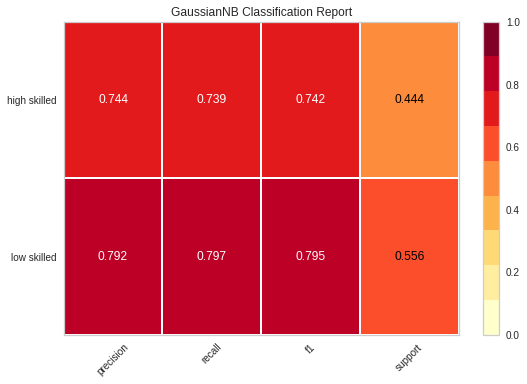

In [46]:
plot_report(gnb)

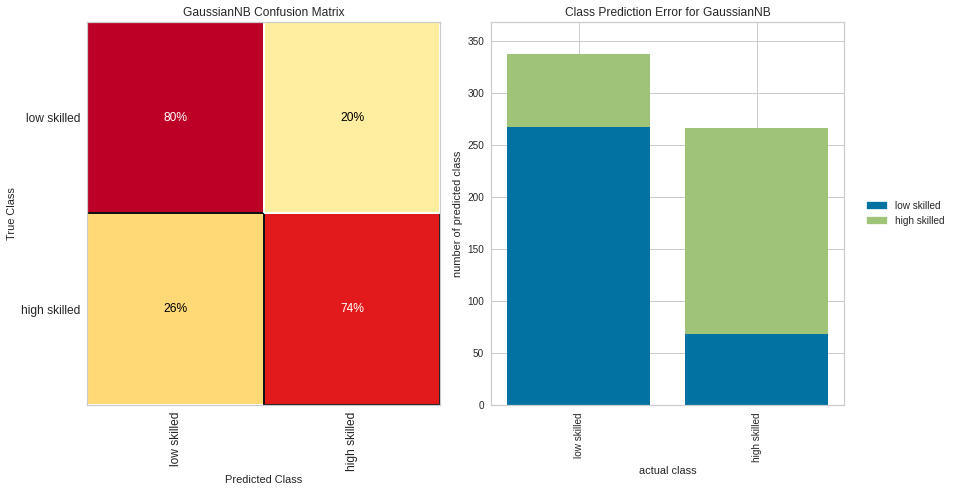

In [47]:
plot_cm_cp(gnb)

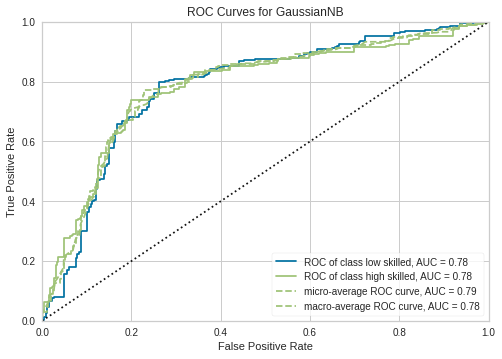

In [48]:
plot_ROC(gnb)

## Classification with Random Forest<a name="random-forest"></a>

RandomForest is a type of ensemble model which uses various decision trees which are fitted on various sub-samples of the dataset, usually it improves the predictive accuracy and it helps control the overfitting.

### Hyperparameters tuning using the grid search

This time we proceed using a randomized search which works similarly to the grid search but it can use a continuous interval of values for the hyper-parameters. The randomized search is lighter in terms of number of computations because it is not fitting on every possible combination but just a subset.

In [49]:
rf_param_grid = {
              "n_estimators": range(3, 100),
              "max_depth": [2,3,5,6,7,10,12,None],
              "min_samples_split": range(2, 64),
              "min_samples_leaf": range(2, 64),
              "bootstrap": [True, False],
              "criterion": ["entropy", "gini"],
              "random_state": [69]
            }

#define the model
clf = RandomForestClassifier()
n_iter_search = 5000
#number of folds
k=10
#define the grid search
rand_rf = RandomizedSearchCV(clf, param_distributions=rf_param_grid,
                            n_jobs=-1, n_iter = n_iter_search, cv=k, verbose=10)

In [50]:
%%script false --no-raise-error

#run the grid search
rand_rf.fit(train_set, train_label)

In [51]:
%%script false --no-raise-error

best_params = rand_rf.best_params_
print('Best setting parameters ', rand_rf.best_params_)

In [52]:
%%script false --no-raise-error

df_results = pd.DataFrame(data=rand_rf.cv_results_)
df_results.sort_values(by="rank_test_score", inplace=True)
df_results = df_results[:50]
pd.DataFrame.to_csv(df_results, "grid_search_results/rand_search.csv")

In [53]:
df_results = pd.read_csv("grid_search_results/rand_search.csv")
df_results.head()

,Unnamed: 0,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_random_state,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_depth,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,1285,0.447442,0.040417,0.025256,0.010990,69,56,11,3,NaN,...,0.941909,0.946058,0.983402,0.954357,0.958506,0.950207,0.966805,0.955230,0.011825,1
1,127,0.465963,0.098716,0.025392,0.013439,69,53,5,2,NaN,...,0.933610,0.933610,0.979253,0.946058,0.954357,0.933610,0.958506,0.947353,0.014110,2
2,303,0.485581,0.049612,0.023777,0.008139,69,73,2,3,NaN,...,0.921162,0.933610,0.966805,0.950207,0.946058,0.937759,0.946058,0.943618,0.013381,3
3,129,0.237065,0.018556,0.012110,0.005456,69,29,15,2,NaN,...,0.912863,0.933610,0.966805,0.941909,0.941909,0.929461,0.958506,0.942368,0.014672,4
4,1176,0.558563,0.033358,0.022182,0.006322,69,85,3,2,10.0,...,0.912863,0.937759,0.962656,0.954357,0.933610,0.937759,0.962656,0.939479,0.016565,5


In [54]:
#rf = rand_rf.best_estimator_
rf = RandomForestClassifier(random_state= 69, n_estimators= 56, min_samples_split= 11, min_samples_leaf= 3, max_depth= None, criterion= 'entropy', bootstrap= False)
rf.fit(train_set, train_label)

RandomForestClassifier(bootstrap=False, criterion='entropy', min_samples_leaf=3,
                       min_samples_split=11, n_estimators=56, random_state=69)

The plot showing the feature importance for the Random Forest is very similar to the plot for the Decision Tree, `win ratio`, `tourPlayed` and `maxAceSvpt` remain the most important feature for the classification. 

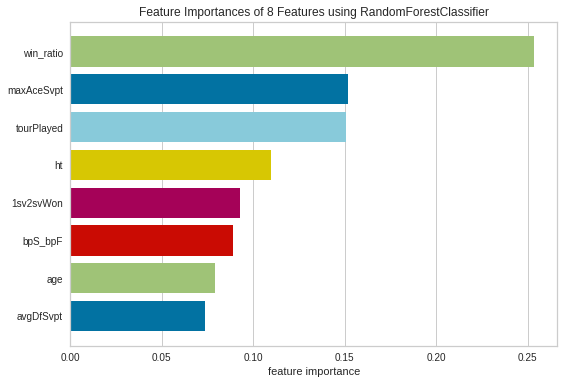

In [55]:
plot_feature_importance(rf)

### Model evaluation

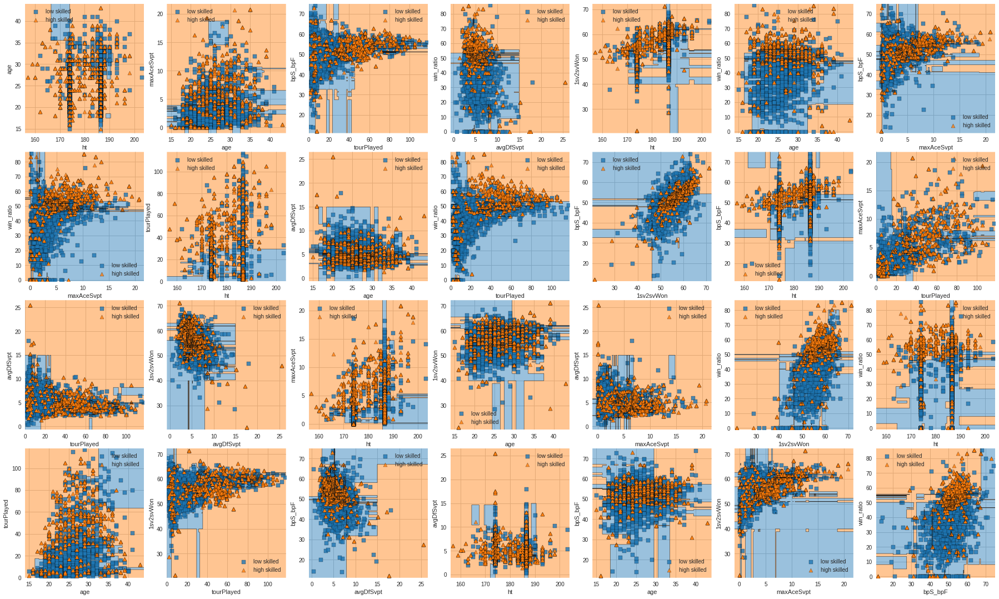

In [56]:
rf_dr = RandomForestClassifier(bootstrap = False, class_weight = {0: 0.45, 1: 0.55}, criterion = 'entropy', max_depth = 16, min_samples_leaf = 10, min_samples_split = 10, n_estimators = 30, random_state = 69)
plot_decision_region(rf_dr)

The Random Forest model gives 100% accuracy on the training set and 96% accuracy on the test set, we can observe that the generalization error is lower confirming that random forest tends to have a better accuracy w.r.t. the decision tree model. This model has higher precision on high skilled players.

In [57]:
#prediction on the train test
train_pred_rf = rf.predict(train_set)
#compute the performance of the model
report = report_scores("Random Forest", train_label, train_pred_rf)
train_results.append(report)

		----Random Forest----
              precision    recall  f1-score   support

 low skilled       1.00      1.00      1.00      1340
high skilled       1.00      1.00      1.00      1072

    accuracy                           1.00      2412
   macro avg       1.00      1.00      1.00      2412
weighted avg       1.00      1.00      1.00      2412



In [58]:
#prediction on the test test
test_pred_rf = rf.predict(test_set)
#compute the performance of the model
report = report_scores("Random Forest", test_label, test_pred_rf)
test_results.append(report)

		----Random Forest----
              precision    recall  f1-score   support

 low skilled       0.99      0.93      0.96       335
high skilled       0.92      0.99      0.95       268

    accuracy                           0.96       603
   macro avg       0.96      0.96      0.96       603
weighted avg       0.96      0.96      0.96       603



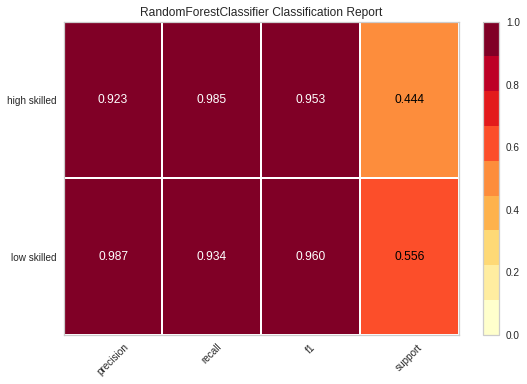

In [59]:
plot_report(rf)

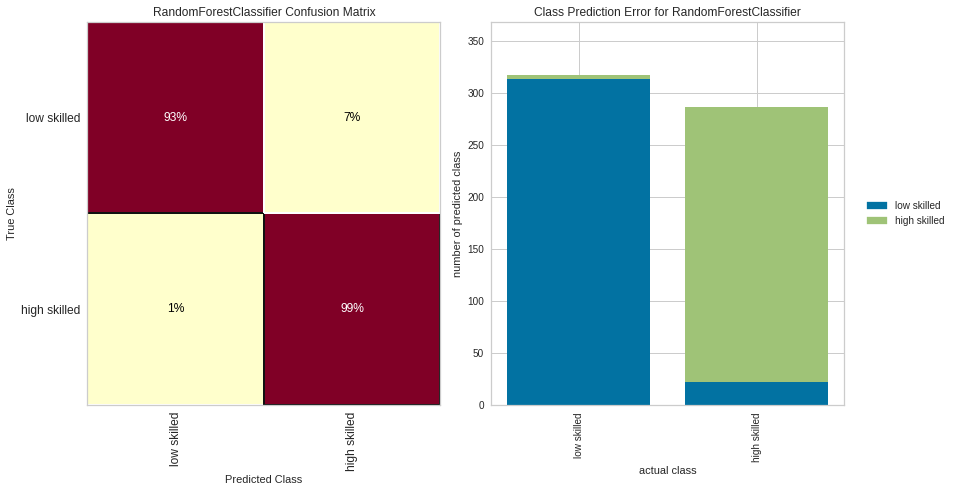

In [60]:
plot_cm_cp(rf)

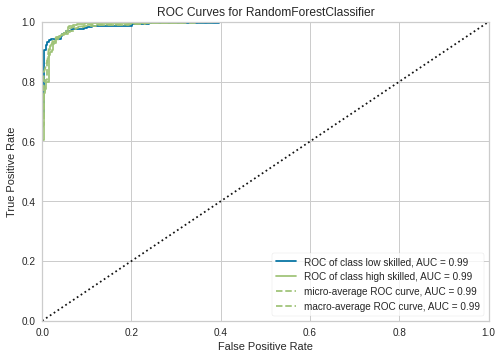

In [61]:
plot_ROC(rf)

## Classification with KNN<a name="knn"></a>

The next model is K Nearest Neighbors which predicts the next instance comparing it with instances seen during the training phase based on a certain metric.

### Hyperparameters tuning using the grid search

Also for the KNN model we use a grid search for the model selection.

In [62]:
knn_params_grid = {
    "n_neighbors": [2, 3, 5, 10, 15, 30, 50, 100],
    "weights": ['uniform', 'distance'],
    "metric": ['euclidean', 'manhattan', 'minkowski'],
    "algorithm": ['ball_tree', 'kd_tree', 'auto'],
    "leaf_size": range(5, 50, 5),
    "n_jobs": [-1]
}

In [63]:
%%script false --no-raise-error

knn_grid = GridSearchCV(KNeighborsClassifier(), param_grid=knn_params_grid)
knn_grid.fit(train_set, train_label)

best_params = knn_grid.best_params_
print('Best parameters setting ', best_params)

In [64]:
%%script false --no-raise-error

best_params = knn_grid.best_params_
print('Best setting parameters ', knn_grid.best_params_)

We define a dataclass to store the optimal values for the second grid search.

In [65]:
from dataclasses import dataclass

@dataclass
class GridSearchRangesKNN:
    '''Class of keeping track of the min and max values for the hyperparameters tuning for K-NN'''
    
    min_nn = 0
    max_nn = 0
    min_leaf_size = 0
    max_leaf_size = 0
    
    def set_ranges(self):

        self.min_nn = np.min(df_results['param_n_neighbors'])
        self.max_nn = np.max(df_results['param_n_neighbors'])
        print(f"Nearest Neighbors: [{self.min_nn}, {self.max_nn}]")

        self.min_leaf_size = np.min(df_results['param_leaf_size'])
        self.max_leaf_size = np.max(df_results['param_leaf_size'])
        print(f"Leaf size: [{self.min_leaf_size}, {self.max_leaf_size}]")    

In [66]:
%%script false --no-raise-error

df_results = pd.DataFrame(data=knn_grid.cv_results_)
df_results.sort_values(by="rank_test_score", inplace=True)
df_results = df_results[:20]
df_results.head()

In [67]:
%%script false --no-raise-error

gs_ranges_knn = GridSearchRangesKNN()
gs_ranges_knn.set_ranges()
print(f"Metric: {np.unique(df_results['param_metric'])}")
print(f"Algorithm: {np.unique(df_results['param_algorithm'])}")
print(f"Weights: {np.unique(df_results['param_weights'])}")

In [68]:
%%script false --no-raise-error

if gs_ranges_knn.min_nn != gs_ranges_knn.max_nn:
    nn = range(gs_ranges_knn.min_nn,gs_ranges_knn.max_nn)
else:
    nn = [gs_ranges_knn.min_nn]
    
if gs_ranges_knn.min_leaf_size != gs_ranges_knn.max_leaf_size:
    leaf_size = range(gs_ranges_knn.min_leaf_size,gs_ranges_knn.max_leaf_size)
else:
    leaf_size = [gs_ranges_knn.min_leaf_size]

algorithm = ["auto", "ball_tree", "kd_tree"]
metric = ["manhattan"]
weights = ["distance"]

knn_params_grid = {
    "n_neighbors": nn,
    "weights": weights,
    "metric": metric,
    "algorithm": algorithm,
    "leaf_size": leaf_size,
    "n_jobs": [-1],
}

In [69]:
%%script false --no-raise-error

knn_grid = GridSearchCV(KNeighborsClassifier(), param_grid=knn_params_grid)
knn_grid.fit(train_set, train_label)


In [70]:
%%script false --no-raise-error

best_params = knn_grid.best_params_
print('Best parameters setting ', best_params)

In [71]:
%%script false --no-raise-error

df_results = pd.DataFrame(data=knn_grid.cv_results_)
df_results.sort_values(by="rank_test_score", inplace=True)
df_results = df_results[:50]
pd.DataFrame.to_csv(df_results, "grid_search_results/knn_grid_search.csv")

In [72]:
df_results = pd.read_csv("grid_search_results/knn_grid_search.csv")
df_results.head()

,Unnamed: 0,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_algorithm,param_leaf_size,param_metric,param_n_jobs,param_n_neighbors,param_weights,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0,0.010379,0.006344,0.015677,0.001700,auto,5,manhattan,-1,2,distance,"{'algorithm': 'auto', 'leaf_size': 5, 'metric'...",0.933747,0.919255,0.96473,0.948133,0.93361,0.939895,0.015414,1
1,87,0.007198,0.000335,0.016315,0.001673,kd_tree,12,manhattan,-1,2,distance,"{'algorithm': 'kd_tree', 'leaf_size': 12, 'met...",0.933747,0.919255,0.96473,0.948133,0.93361,0.939895,0.015414,1
2,86,0.006952,0.000664,0.016596,0.002332,kd_tree,11,manhattan,-1,2,distance,"{'algorithm': 'kd_tree', 'leaf_size': 11, 'met...",0.933747,0.919255,0.96473,0.948133,0.93361,0.939895,0.015414,1
3,85,0.007410,0.000169,0.016247,0.001108,kd_tree,10,manhattan,-1,2,distance,"{'algorithm': 'kd_tree', 'leaf_size': 10, 'met...",0.933747,0.919255,0.96473,0.948133,0.93361,0.939895,0.015414,1
4,84,0.006277,0.001406,0.014459,0.001200,kd_tree,9,manhattan,-1,2,distance,"{'algorithm': 'kd_tree', 'leaf_size': 9, 'metr...",0.933747,0.919255,0.96473,0.948133,0.93361,0.939895,0.015414,1


### Model evaluation

In [73]:
#knn = knn_grid.best_estimator_
knn = KNeighborsClassifier(algorithm = 'auto', leaf_size = 5, metric = 'manhattan', n_jobs = -1, n_neighbors = 2, weights = 'distance')
knn.fit(train_set.values, train_label.values)

knn_dr = KNeighborsClassifier(algorithm = 'auto', leaf_size = 5, metric = 'manhattan', n_jobs = -1, n_neighbors = 2, weights = 'distance')

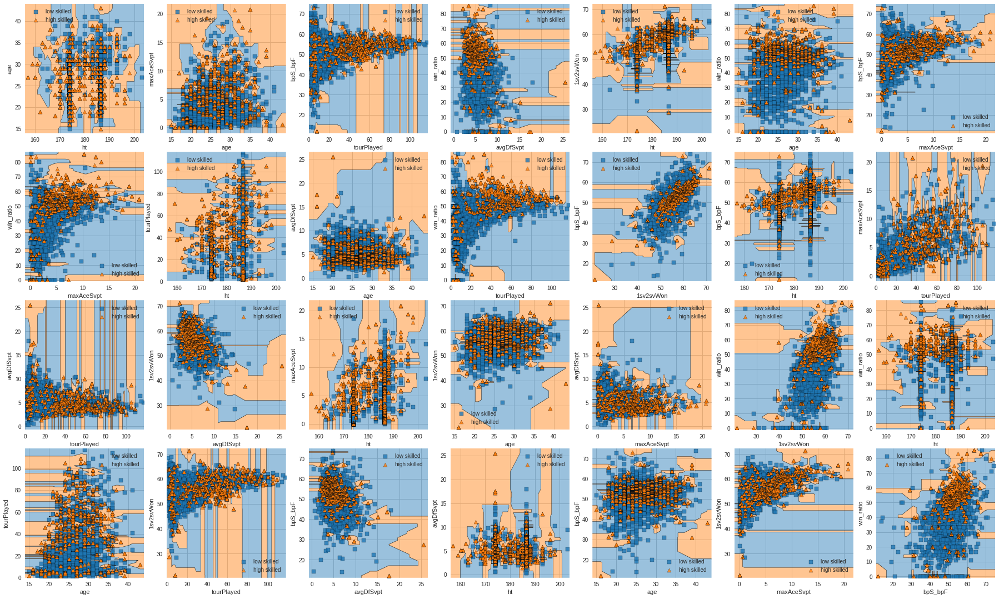

In [74]:
plot_decision_region(knn_dr)

In [75]:
#prediction on the train set
train_pred_knn = knn.predict(train_set.values)
#prediction on the test test
test_pred_knn = knn.predict(test_set.values)

KNN gives an accuracy performance of 100% on the training set and 95% on the test set.

In [76]:
report = report_scores("KNN", train_label, train_pred_knn)
train_results.append(report)

		----KNN----
              precision    recall  f1-score   support

 low skilled       1.00      1.00      1.00      1340
high skilled       1.00      1.00      1.00      1072

    accuracy                           1.00      2412
   macro avg       1.00      1.00      1.00      2412
weighted avg       1.00      1.00      1.00      2412



In [77]:
#compute the performance of the model
report = report_scores("KNN", test_label, test_pred_knn)
test_results.append(report)

		----KNN----
              precision    recall  f1-score   support

 low skilled       0.99      0.91      0.95       335
high skilled       0.90      0.99      0.94       268

    accuracy                           0.95       603
   macro avg       0.95      0.95      0.95       603
weighted avg       0.95      0.95      0.95       603



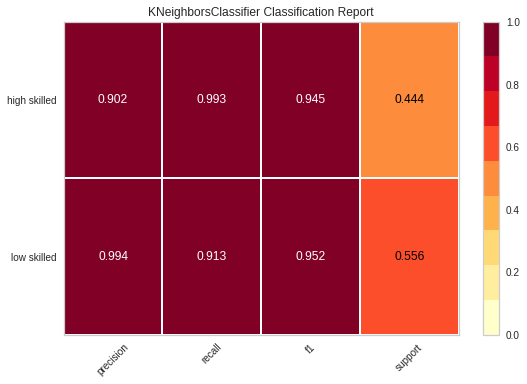

In [78]:
plot_report(knn)

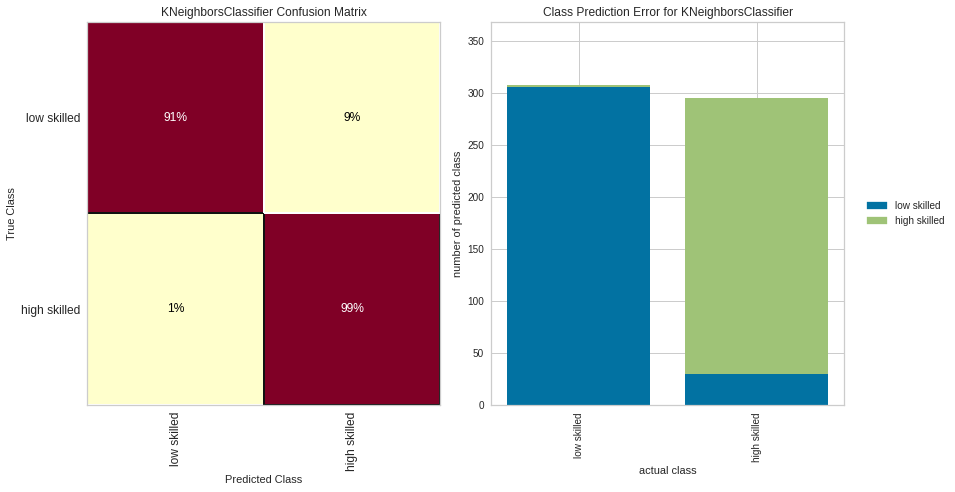

In [79]:
plot_cm_cp(knn)

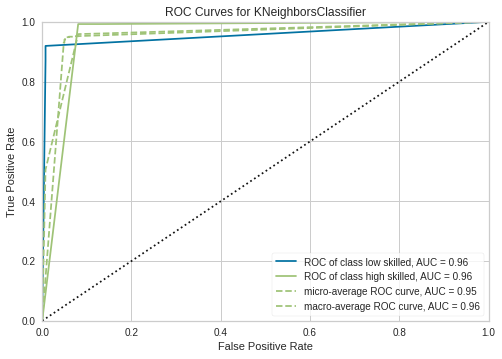

In [80]:
plot_ROC(knn)

## Classification with SVM<a name="svm"></a>

Next we try the SVM (Support Vector Machines) model which is a model with statistical learning roots that can have promising results in different applications.

### Hyperparameters tuning using the grid search

As usual a grid search is performed to find the best hyper parameters for the SVM.

In [81]:
svm_param_grid = {'C': [0.1, 0.5, 1, 100, 300, 600, 1000],
                'gamma': ['scale', 1, 0.1, 0.01, 0.001, 0.0001],
                'kernel': ['rbf', 'sigmoid', 'linear', 'poly'],
                'probability': [True],
                'max_iter': [10000],
                'random_state': [69],}


In [82]:
%%script false --no-raise-error

svm_grid = GridSearchCV(SVC(), param_grid=svm_param_grid, verbose=10)
svm_grid.fit(train_set, train_label)

In [83]:
%%script false --no-raise-error

best_params = svm_grid.best_params_
print('Best parameters setting ', best_params)

### Model evaluation

In [84]:
%%script false --no-raise-error

df_results = pd.DataFrame(data=svm_grid.cv_results_)
df_results.sort_values(by="rank_test_score", inplace=True)
df_results = df_results[:50]
pd.DataFrame.to_csv(df_results, "grid_search_results/svm_grid_search.csv")

In [85]:
df_results = pd.read_csv("grid_search_results/svm_grid_search.csv")
df_results.head()

,Unnamed: 0,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,param_kernel,param_max_iter,param_probability,param_random_state,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,128,0.658945,0.078553,0.033667,0.002848,600.0,0.1,rbf,10000,True,69,"{'C': 600, 'gamma': 0.1, 'kernel': 'rbf', 'max...",0.987578,0.977226,0.981328,0.975104,0.975104,0.979268,0.004736,1
1,104,0.602433,0.026140,0.030372,0.001146,300.0,0.1,rbf,10000,True,69,"{'C': 300, 'gamma': 0.1, 'kernel': 'rbf', 'max...",0.987578,0.977226,0.981328,0.975104,0.975104,0.979268,0.004736,1
2,152,0.595013,0.011772,0.029763,0.000314,1000.0,0.1,rbf,10000,True,69,"{'C': 1000, 'gamma': 0.1, 'kernel': 'rbf', 'ma...",0.987578,0.977226,0.981328,0.975104,0.975104,0.979268,0.004736,1
3,80,0.634090,0.049402,0.032237,0.003473,100.0,0.1,rbf,10000,True,69,"{'C': 100, 'gamma': 0.1, 'kernel': 'rbf', 'max...",0.987578,0.977226,0.981328,0.975104,0.975104,0.979268,0.004736,1
4,56,0.701246,0.043177,0.034648,0.001338,1.0,0.1,rbf,10000,True,69,"{'C': 1, 'gamma': 0.1, 'kernel': 'rbf', 'max_i...",0.987578,0.977226,0.981328,0.975104,0.975104,0.979268,0.004736,1


In [86]:
svm = SVC(C = 1, gamma = 0.1, kernel = 'rbf', max_iter = 10000, probability = True, random_state = 69).fit(train_set, train_label)
svm.fit(train_set, train_label)

SVC(C=1, gamma=0.1, max_iter=10000, probability=True, random_state=69)

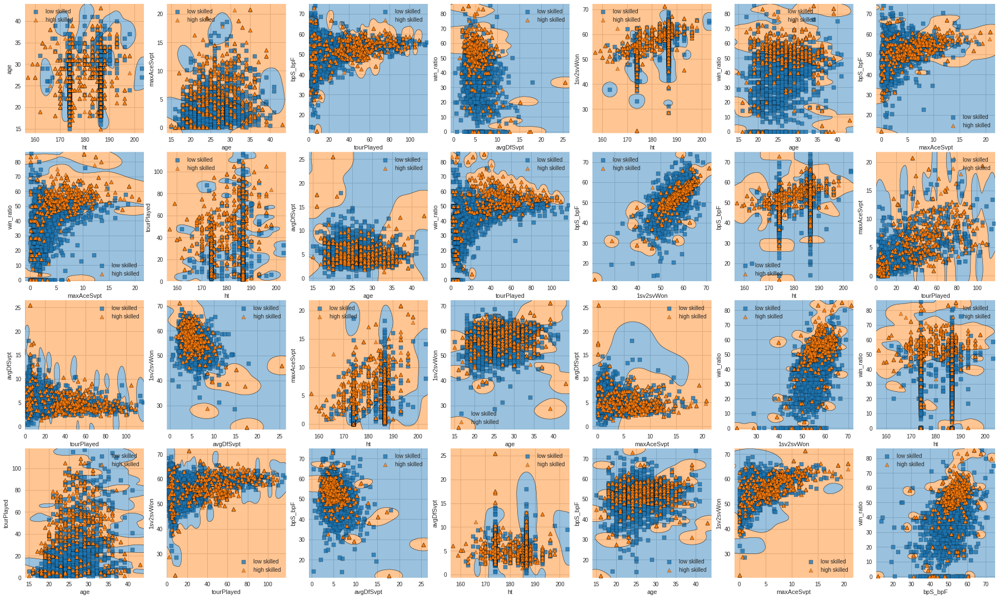

In [87]:
#%%script false --no-raise-error
svm_dr = SVC(C = 1, gamma = 0.1, kernel = 'rbf', max_iter = 10000, probability = True, random_state = 69).fit(train_set, train_label)
plot_decision_region(svm_dr)

In [88]:
#prediction on the train set
train_pred_svm = svm.predict(train_set.values)
#prediction on the test test
test_pred_svm = svm.predict(test_set.values)

SVM has by far the best performance on the test set in terms of accuracy (99%), precision (99% and 100%) and recall (100% and 99%). We believe that this is due to the capacity of SVM models to still be linearly separable even in high dimensions, thus having more complex models with the benefits of a linear model.

In [89]:
report = report_scores("SVM", train_label, train_pred_svm)
train_results.append(report)

		----SVM----
              precision    recall  f1-score   support

 low skilled       1.00      1.00      1.00      1340
high skilled       1.00      1.00      1.00      1072

    accuracy                           1.00      2412
   macro avg       1.00      1.00      1.00      2412
weighted avg       1.00      1.00      1.00      2412



In [90]:
#compute the performance of the model
report = report_scores("SVM", test_label, test_pred_svm)
test_results.append(report)

		----SVM----
              precision    recall  f1-score   support

 low skilled       0.99      1.00      0.99       335
high skilled       1.00      0.99      0.99       268

    accuracy                           0.99       603
   macro avg       0.99      0.99      0.99       603
weighted avg       0.99      0.99      0.99       603



In [91]:
#prediction on the train set
train_pred_proba_svm = svm.predict_proba(train_set)
#prediction on the test set
test_pred_proba_svm = svm.predict_proba(test_set)

In [92]:
test_pred_proba_svm

array([[9.47400468e-08, 9.99999905e-01],
       [9.79282774e-01, 2.07172258e-02],
       [9.87305192e-01, 1.26948077e-02],
       ...,
       [9.47024258e-08, 9.99999905e-01],
       [9.91948549e-01, 8.05145090e-03],
       [9.86217935e-01, 1.37820652e-02]])

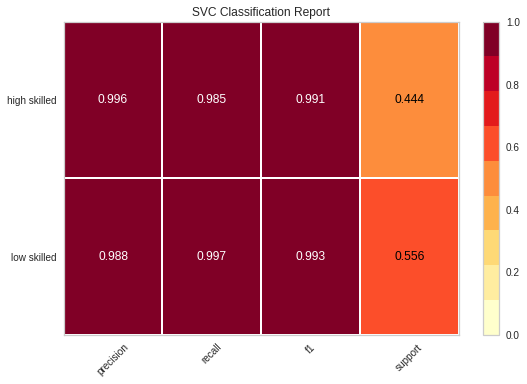

In [93]:
plot_report(svm)

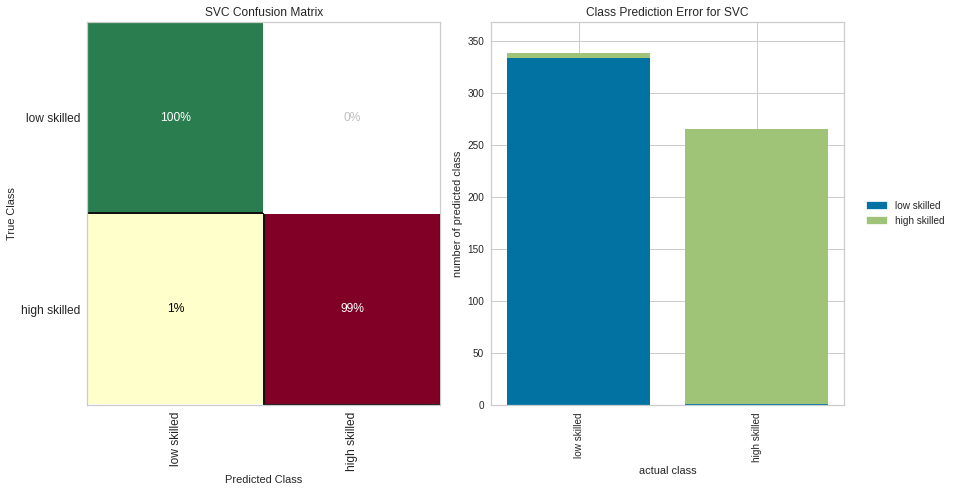

In [94]:
plot_cm_cp(svm)

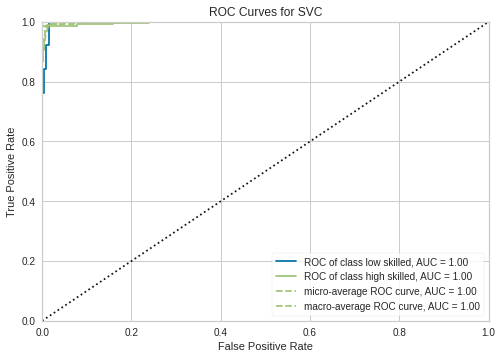

In [95]:
plot_ROC(svm)

## Rule based classifier<a name="ripper"></a>

Next we try RIPPER which is a direct method used to learn classification rules.

### Hyperparameters tuning using the grid search

In [96]:
# prune_size: change the grow/prune proportion
# k: the number of optimization runs
# dl_allowance: the complexity stopping threshold
# verbosity (1–5): check how rules get generated
# n_discretize_bins: wittgenstein will automatically detect and discretize continuous features for you

ripper_param_grid = {
    "prune_size": [0.2, 0.4, 0.6, 0.8, 1], 
    "k": [0, 1, 3, 5], 
    "dl_allowance": [16, 32, 64, 128, 160, 200, 256],
    "random_state": [69]
}

In [97]:
%%script false --no-raise-error

ripper_grid_search = GridSearchCV(estimator=lw.RIPPER(), param_grid=ripper_param_grid, n_jobs=-1, cv=k, verbose=10)
ripper_grid_search.fit(train_set, train_label)
best_params = ripper_grid_search.best_params_
print('Best parameters setting ', best_params)

In [98]:
%%script false --no-raise-error

df_results = pd.DataFrame(data=ripper_grid_search.cv_results_)
df_results.sort_values(by="rank_test_score", inplace=True)
df_results = df_results[:50]
pd.DataFrame.to_csv(df_results, "grid_search_results/ripper_grid_search.csv")

In [99]:
df_results = pd.read_csv("grid_search_results/ripper_grid_search.csv")
df_results.head()

,Unnamed: 0,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_dl_allowance,param_k,param_prune_size,param_random_state,params,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,81,4.465573,0.424007,1.082982,0.119973,160,0,0.4,69,"{'dl_allowance': 160, 'k': 0, 'prune_size': 0....",...,0.804979,0.796680,0.804979,0.842324,0.875519,0.796680,0.850622,0.819253,0.02639,1
1,121,4.615833,0.373771,1.066698,0.131285,256,0,0.4,69,"{'dl_allowance': 256, 'k': 0, 'prune_size': 0....",...,0.804979,0.796680,0.804979,0.842324,0.875519,0.796680,0.850622,0.819253,0.02639,1
2,101,4.564972,0.431295,1.127408,0.157614,200,0,0.4,69,"{'dl_allowance': 200, 'k': 0, 'prune_size': 0....",...,0.804979,0.796680,0.804979,0.842324,0.875519,0.796680,0.850622,0.819253,0.02639,1
3,61,4.427656,0.578094,1.091526,0.266835,128,0,0.4,69,"{'dl_allowance': 128, 'k': 0, 'prune_size': 0....",...,0.804979,0.796680,0.804979,0.842324,0.875519,0.796680,0.850622,0.819253,0.02639,1
4,120,4.764391,0.430776,1.113529,0.105070,256,0,0.2,69,"{'dl_allowance': 256, 'k': 0, 'prune_size': 0....",...,0.817427,0.809129,0.800830,0.825726,0.838174,0.863071,0.800830,0.816342,0.02432,5


### Model evaluation

In [100]:
ripper = lw.RIPPER(dl_allowance=128, k=0, prune_size = 0.4, random_state = 69)

datas = pd.concat([train_set, train_label], axis=1)
ripper.fit(datas, class_feat='rank', pos_class=1)
ripper.out_model()

[[win_ratio=>61.11 ^ maxAceSvpt=>10.23] V
[win_ratio=57.2-61.11 ^ maxAceSvpt=>10.23] V
[tourPlayed=44.0-56.0 ^ ht=<173.92 ^ 1sv2svWon=53.86-55.23] V
[win_ratio=57.2-61.11 ^ ht=<173.92 ^ 1sv2svWon=55.23-56.5] V
[win_ratio=>61.11 ^ maxAceSvpt=6.15-7.83] V
[maxAceSvpt=7.83-10.23 ^ tourPlayed=56.0-69.0 ^ avgDfSvpt=3.11-3.57] V
[win_ratio=57.2-61.11 ^ maxAceSvpt=7.83-10.23 ^ age=23.0-25.0] V
[tourPlayed=56.0-69.0 ^ ht=<173.92 ^ maxAceSvpt=7.83-10.23] V
[win_ratio=57.2-61.11 ^ tourPlayed=44.0-56.0 ^ avgDfSvpt=6.84-8.1] V
[win_ratio=53.93-57.2 ^ tourPlayed=>69.0 ^ 1sv2svWon=60.42-61.96] V
[tourPlayed=56.0-69.0 ^ ht=175.0-181.0 ^ win_ratio=50.55-53.93] V
[win_ratio=>61.11 ^ maxAceSvpt=7.83-10.23] V
[win_ratio=57.2-61.11 ^ tourPlayed=33.0-44.0] V
[win_ratio=53.93-57.2 ^ tourPlayed=>69.0 ^ maxAceSvpt=4.71-6.15] V
[tourPlayed=44.0-56.0 ^ 1sv2svWon=52.0-53.86] V
[win_ratio=53.93-57.2 ^ tourPlayed=>69.0 ^ age=20.0-22.0] V
[win_ratio=57.2-61.11 ^ tourPlayed=>69.0] V
[win_ratio=53.93-57.2 ^ ht=<173.9

With this model we can also get a more interpretable result and discover what rules were applied to decide if a given player is an "high skilled" one. We print then the rules and the attributes for that player. 

In [101]:
predictions = ripper.predict(test_set, give_reasons=True)

i = 0
for pred in predictions[0]:
    if pred:
        print(predictions[1][i])
        print(test_set[i:i+1]) 
        print("\n")

    i = i + 1

[<Rule [win_ratio=47.47-50.55^avgDfSvpt=4.85-5.33^bpS_bpF=>58.7]>]
         ht   age  tourPlayed  maxAceSvpt  avgDfSvpt  1sv2svWon  bpS_bpF  \
2727  183.0  39.0           7         1.1       5.15      64.65     65.5   

      win_ratio  
2727       50.0  


[<Rule [tourPlayed=44.0-56.0^win_ratio=53.93-57.2]>]
          ht   age  tourPlayed  maxAceSvpt  avgDfSvpt  1sv2svWon  bpS_bpF  \
1932  186.54  23.0          53       13.93       6.38      59.19    56.44   

      win_ratio  
1932      56.49  


[<Rule [win_ratio=53.93-57.2^tourPlayed=>69.0^maxAceSvpt=4.71-6.15]>, <Rule [ht=175.0-181.0^maxAceSvpt=4.71-6.15]>]
         ht   age  tourPlayed  maxAceSvpt  avgDfSvpt  1sv2svWon  bpS_bpF  \
2639  180.0  27.0          74        6.15       4.88      60.09    56.13   

      win_ratio  
2639       54.8  


[<Rule [tourPlayed=44.0-56.0^win_ratio=53.93-57.2]>, <Rule [ht=>186.54^1sv2svWon=>61.96^win_ratio=53.93-57.2]>]
         ht   age  tourPlayed  maxAceSvpt  avgDfSvpt  1sv2svWon  bpS_bpF  \
1

[<Rule [win_ratio=57.2-61.11^tourPlayed=>69.0]>]
         ht   age  tourPlayed  maxAceSvpt  avgDfSvpt  1sv2svWon  bpS_bpF  \
1201  188.0  29.0          81         9.7       4.68      60.27     57.1   

      win_ratio  
1201      59.19  


[<Rule [age=>33.0^bpS_bpF=56.73-58.7]>]
         ht   age  tourPlayed  maxAceSvpt  avgDfSvpt  1sv2svWon  bpS_bpF  \
2547  166.0  34.0          10         1.1      11.07      46.39    57.46   

      win_ratio  
2547      28.57  


[<Rule [tourPlayed=4.0-6.0^bpS_bpF=42.65-47.03^age=<20.0^1sv2svWon=<49.3]>]
          ht   age  tourPlayed  maxAceSvpt  avgDfSvpt  1sv2svWon  bpS_bpF  \
1341  173.92  17.0           6        0.01       2.92       47.6    44.62   

      win_ratio  
1341      33.33  


[<Rule [win_ratio=50.55-53.93^ht=<173.92^maxAceSvpt=6.15-7.83]>]
          ht   age  tourPlayed  maxAceSvpt  avgDfSvpt  1sv2svWon  bpS_bpF  \
2756  173.92  24.0          38        6.97      10.34       53.5    51.76   

      win_ratio  
2756      51.66  


[<

         ht   age  tourPlayed  maxAceSvpt  avgDfSvpt  1sv2svWon  bpS_bpF  \
789  186.54  22.0          31        9.22       5.47      63.59     57.3   

     win_ratio  
789      63.27  


[<Rule [age=<20.0^bpS_bpF=48.94-50.84^win_ratio=<18.18]>]
          ht   age  tourPlayed  maxAceSvpt  avgDfSvpt  1sv2svWon  bpS_bpF  \
2525  186.54  20.0           6        3.45       8.16      49.94    49.17   

      win_ratio  
2525      11.11  


[<Rule [tourPlayed=4.0-6.0^win_ratio=<18.18^avgDfSvpt=5.33-5.97^maxAceSvpt=<0.75^1sv2svWon=49.3-52.0]>]
          ht   age  tourPlayed  maxAceSvpt  avgDfSvpt  1sv2svWon  bpS_bpF  \
2540  186.54  21.0           5        0.36       5.71      50.37    39.66   

      win_ratio  
2540        0.0  


[<Rule [tourPlayed=44.0-56.0^1sv2svWon=52.0-53.86]>, <Rule [ht=<173.92^win_ratio=43.06-47.47^1sv2svWon=52.0-53.86]>]
          ht   age  tourPlayed  maxAceSvpt  avgDfSvpt  1sv2svWon  bpS_bpF  \
1905  173.92  27.0          52        3.74       4.51      53.18    4

In [102]:
print("Score on train set")
report = f"Accuracy {ripper.score(train_set, train_label)}\n\
Precision {ripper.score(train_set, train_label, precision_score)}\n\
Recall {ripper.score(train_set, train_label, recall_score)}"
print(report)

train_results.append({'RIPPER': report})

Score on train set
Accuracy 0.6339137645107794
Precision 0.7925696594427245
Recall 0.23880597014925373


We can see that RIPPER is underperforming w.r.t the other models with a very low accuracy of 75% on the test set.

In [103]:
print("Score on test set")
report = f"Accuracy {ripper.score(test_set, test_label)}\n\
Precision {ripper.score(test_set, test_label, precision_score)}\n\
Recall {ripper.score(test_set, test_label, recall_score)}"
print(report)

test_results.append({'RIPPER': report})

Score on test set
Accuracy 0.7562189054726368
Precision 0.8167539267015707
Recall 0.582089552238806


From the confusion matrix we can see that RIPPER tends to misclassify high skilled players as low skilled players.

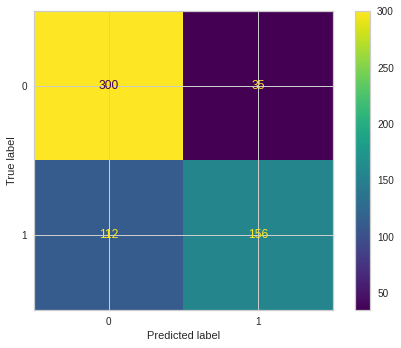

In [104]:
plot_confusion_matrix(ripper, test_set, test_label)
plt.show() 

## Classification with NN<a name="nn"></a>

The neural network model also uses a more flexible approach towards the classification task, in this case there are more hyper parameters to be tuned.

### Randomized search for tuning the hyper-parameters

In [105]:
%%script false --no-raise-error

# to find the best set of parameter setting, we can run a grid search
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
from scipy.stats import randint
from sklearn.metrics import make_scorer

# define the parameters' values
params = {
    "hidden_layer_sizes": [
        (5,),
        (10,),
        (25,),
        (50,),
        (100,),
        (200,),
        (500,),
        (5, 5),
        (10, 10),
        (25, 25),
        (50, 50),
        (100, 100),
        (200, 200),
        (500, 500)
    ],
    "activation" : ["logistic", "tanh", "relu"],
    "solver": ["sgd", "adam"],
    "learning_rate": ["constant", "adaptive", "invscaling"],
    "learning_rate_init": uniform(0.001, 0.1),
    "alpha": uniform(0.0001, 0.01),
    "batch_size": randint(1, train_set.shape[0]),
    "n_iter_no_change": [
        10,
        25,
        50,
    ],
    "random_state": [69],
    "tol": uniform(0.0001,0.0005),
    "early_stopping": [False],
    "validation_fraction": [0.2],
    "max_iter": [5000],
}
# define the number of iterations
n_iter_search = 1000
# define number of k-folds
k = 5
# define the grid search
rand_gs = RandomizedSearchCV(
    MLPClassifier(),
    param_distributions=params,
    n_iter=n_iter_search,
    n_jobs=-1,
    cv=k,
    random_state=69,
    verbose=10
)
# run the grid search
rand_gs.fit(train_set, train_label)

In [106]:
%%script false --no-raise-error

df_results = pd.DataFrame(data=rand_gs.cv_results_) #trasform into a pandas dataframe
df_results.sort_values(by="rank_test_score", axis=0, ascending=True, inplace=True) #sort rank values in decreasing order 
df_results.dropna(inplace=True) #delete nan values 
df_results = df_results[:50] #keep only top 50 models
pd.DataFrame.to_csv(df_results, "grid_search_results/rand_nn_search.csv")

In [107]:
df_results = pd.read_csv("grid_search_results/rand_nn_search.csv")
df_results.head()

,Unnamed: 0,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_activation,param_alpha,param_batch_size,param_early_stopping,param_hidden_layer_sizes,...,param_validation_fraction,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,136,25.896838,11.456128,0.006744,0.000287,tanh,0.000645,2339,False,"(100, 100)",...,0.2,"{'activation': 'tanh', 'alpha': 0.000645198144...",0.850932,0.879917,0.902490,0.906639,0.873444,0.882684,0.020334,1
1,296,25.474698,9.194134,0.005609,0.001235,tanh,0.005153,1509,False,"(50, 50)",...,0.2,"{'activation': 'tanh', 'alpha': 0.005153250164...",0.850932,0.875776,0.877593,0.877593,0.919087,0.880196,0.021918,2
2,118,136.082922,34.653400,0.008297,0.000961,logistic,0.004578,542,False,"(200, 200)",...,0.2,"{'activation': 'logistic', 'alpha': 0.00457754...",0.857143,0.859213,0.900415,0.887967,0.873444,0.875636,0.016629,3
3,55,15.180183,1.253628,0.003785,0.000867,logistic,0.003847,1257,False,"(50, 50)",...,0.2,"{'activation': 'logistic', 'alpha': 0.00384741...",0.871636,0.855072,0.904564,0.871369,0.867220,0.873972,0.016437,4
4,295,244.284166,60.100075,0.029396,0.005805,logistic,0.005072,1251,False,"(500, 500)",...,0.2,"{'activation': 'logistic', 'alpha': 0.00507216...",0.830228,0.871636,0.865145,0.887967,0.892116,0.869418,0.021992,5


In [108]:
best_params = df_results['params'][0]
print(f"Best params: {best_params}")

Best params: {'activation': 'tanh', 'alpha': 0.0006451981448187716, 'batch_size': 2339, 'early_stopping': False, 'hidden_layer_sizes': (100, 100), 'learning_rate': 'adaptive', 'learning_rate_init': 0.0033006308317152446, 'max_iter': 5000, 'n_iter_no_change': 50, 'random_state': 69, 'solver': 'adam', 'tol': 0.0002199557168530598, 'validation_fraction': 0.2}


In [109]:
%%script false --no-raise-error

# define the parameters' values
params = {
    "hidden_layer_sizes": [(100,100)],
    "activation" : ["logistic", "tanh"],
    "solver": ["sgd", "adam"],
    "learning_rate": ["adaptive", "invscaling"],
    "learning_rate_init": uniform(0.001, 0.005),
    "alpha": uniform(0.0001, 0.0009),
    "batch_size": randint(1000, 2339),
    "n_iter_no_change": [50],
    "random_state": [69],
    "tol": uniform(0.0001,0.0005),
    "early_stopping": [True],
    "validation_fraction": [0.2],
    "max_iter": [5000],
}
# define the number of iterations
n_iter_search = 10
# define the model
classifier = MLPClassifier()
# define number of k-folds
k = 5
# define the grid search
rand_gs = RandomizedSearchCV(
    classifier,
    param_distributions=params,
    n_iter=n_iter_search,
    n_jobs=-1,
    cv=k,
    verbose=10,
)
# run the grid search
rand_gs.fit(train_set, train_label)

In [110]:
%%script false --no-raise-error

df_results = pd.DataFrame(data=rand_gs.cv_results_) #trasform into a pandas dataframe
df_results.sort_values(by="rank_test_score", axis=0, ascending=True, inplace=True) #sort rank values in decreasing order 
df_results.dropna(inplace=True) #delete nan values 
df_results = df_results[:50] #keep only top 50 models
pd.DataFrame.to_csv(df_results, "grid_search_results/rand2_nn_search.csv")

In [111]:
df_results = pd.read_csv("grid_search_results/rand2_nn_search.csv")
df_results.head()

,Unnamed: 0,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_activation,param_alpha,param_batch_size,param_early_stopping,param_hidden_layer_sizes,...,param_validation_fraction,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,93,12.695313,3.658365,0.014842,0.004978,tanh,0.000253,1022,True,"(100, 100)",...,0.2,"{'activation': 'tanh', 'alpha': 0.000253267048...",0.828157,0.855072,0.885892,0.865145,0.869295,0.860712,0.019073,1
1,54,14.383767,4.669313,0.013241,0.006596,tanh,0.000805,1586,True,"(100, 100)",...,0.2,"{'activation': 'tanh', 'alpha': 0.000804679470...",0.850932,0.846791,0.854772,0.863071,0.856846,0.854482,0.005499,2
2,7,12.904823,3.340466,0.014670,0.005517,tanh,0.000513,1949,True,"(100, 100)",...,0.2,"{'activation': 'tanh', 'alpha': 0.000513425606...",0.855072,0.834369,0.871369,0.848548,0.860996,0.854071,0.012385,3
3,13,9.094404,3.184235,0.006531,0.003805,logistic,0.000392,1780,True,"(100, 100)",...,0.2,"{'activation': 'logistic', 'alpha': 0.00039170...",0.859213,0.830228,0.871369,0.840249,0.869295,0.854071,0.016229,3
4,34,14.091718,3.441416,0.011873,0.004380,tanh,0.000560,1904,True,"(100, 100)",...,0.2,"{'activation': 'tanh', 'alpha': 0.000559883504...",0.853002,0.838509,0.885892,0.836100,0.854772,0.853655,0.017768,5


In [112]:
nn =  MLPClassifier(activation= 'tanh', alpha = 0.0002, batch_size = 500, early_stopping= False, hidden_layer_sizes = (100, 100), learning_rate = 'constant', learning_rate_init= 0.0033006308317152446, max_iter= 1200, n_iter_no_change= 100, random_state= 69, solver = 'adam', tol = 0.00002).fit(train_set, train_label)

In [113]:
eval_nn =  MLPClassifier(activation= 'tanh', alpha = 0.0002, batch_size = 500, early_stopping= False, hidden_layer_sizes = (100, 100), learning_rate = 'constant', learning_rate_init= 0.0033006308317152446, max_iter= 1200, n_iter_no_change= 100, random_state= 69, solver = 'adam', tol = 0.00002)
nn_dr =  MLPClassifier(activation= 'tanh', alpha = 0.0002, batch_size = 500, early_stopping= False, hidden_layer_sizes = (100, 100), learning_rate = 'constant', learning_rate_init= 0.0033006308317152446, max_iter= 1200, n_iter_no_change= 100, random_state= 69, solver = 'adam', tol = 0.00002)

In [114]:
train_scores, test_scores = fit_and_score(nn.n_iter_, eval_nn, train_set, train_label, test_set, test_label)

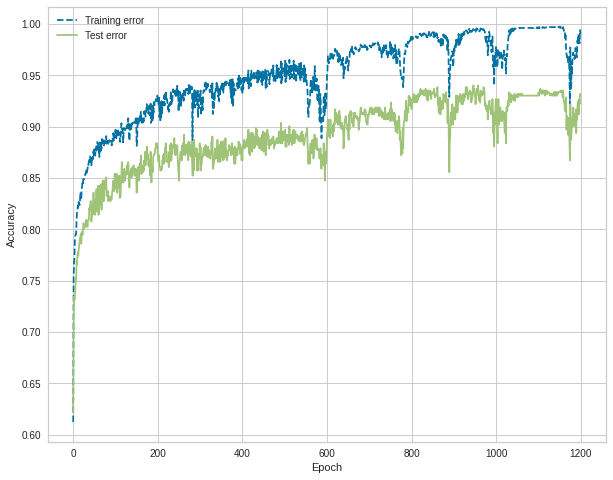

In [115]:
plot_learning_curves(train_scores, test_scores, nn.n_iter_, "Accuracy")

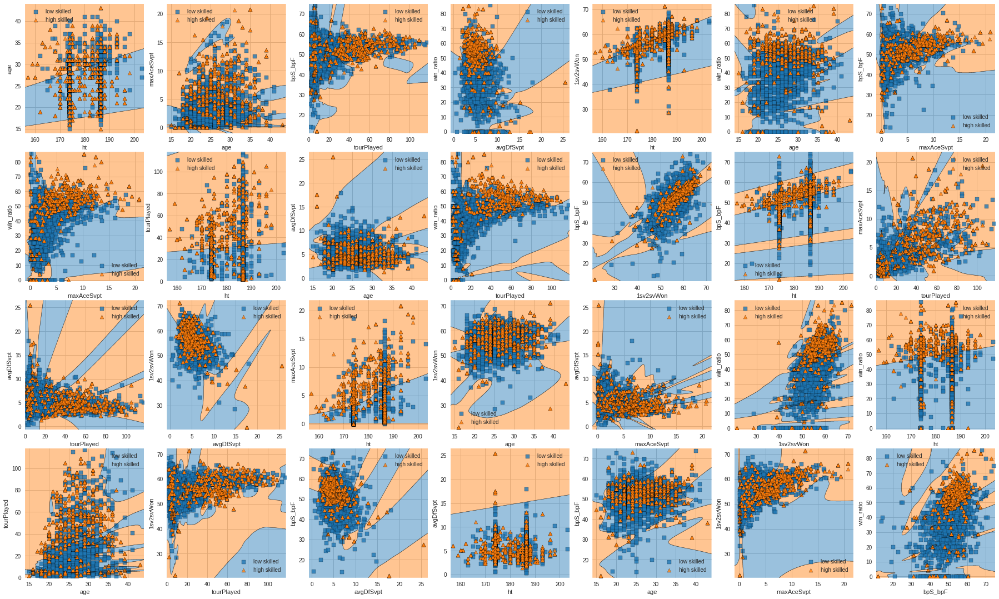

In [116]:
#%%script false --no-raise-error
plot_decision_region(nn_dr)

### Model evaluation on NN

In [117]:
train_pred_nn = nn.predict(train_set)
# score on train set
report = report_scores("Neural Network", train_label, train_pred_nn)
train_results.append(report)

		----Neural Network----
              precision    recall  f1-score   support

 low skilled       0.99      0.98      0.99      1340
high skilled       0.98      0.99      0.98      1072

    accuracy                           0.98      2412
   macro avg       0.98      0.99      0.98      2412
weighted avg       0.98      0.98      0.98      2412



In [118]:
test_pred_nn = nn.predict(test_set)
# score on test set
report = report_scores("Neural Network", test_label, test_pred_nn)
test_results.append(report)

		----Neural Network----
              precision    recall  f1-score   support

 low skilled       0.97      0.90      0.93       335
high skilled       0.88      0.97      0.93       268

    accuracy                           0.93       603
   macro avg       0.93      0.93      0.93       603
weighted avg       0.93      0.93      0.93       603



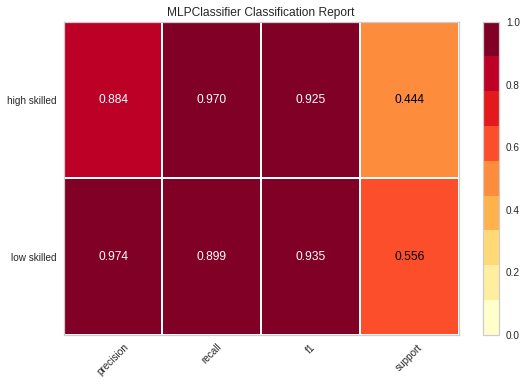

In [119]:
plot_report(nn)

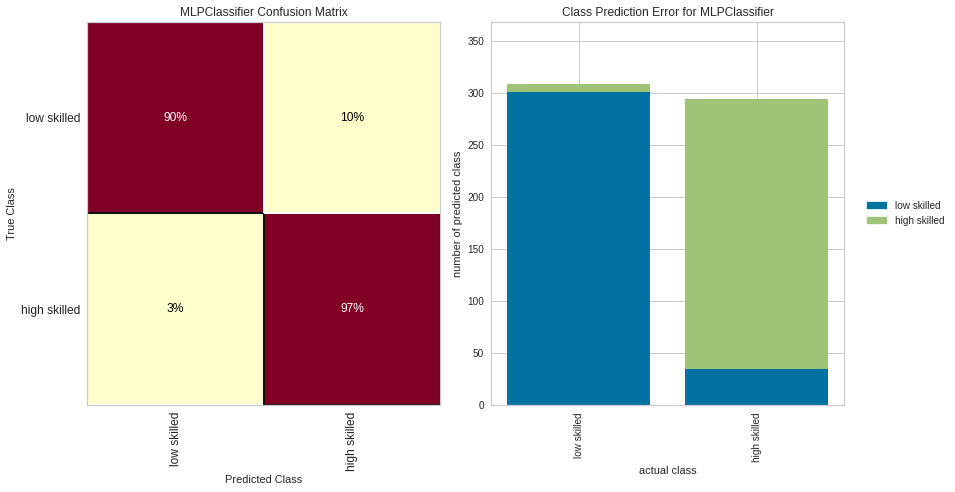

In [120]:
plot_cm_cp(nn)

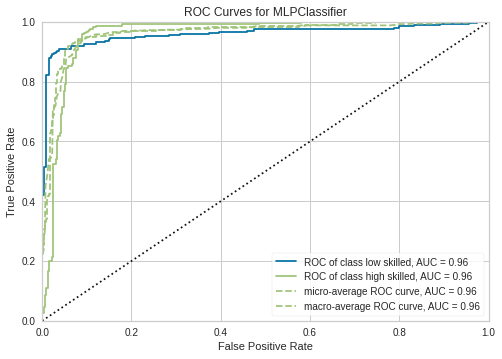

In [121]:
plot_ROC(nn)

## Ensemble of all models<a name="ensemble-models"></a>

In [122]:
ensemble = VotingClassifier(estimators=[
    ('dt', dt), ('rf', rf) , ('knn', knn), ('svm', svm), ('nn', nn)], 
    n_jobs = -1)
ensemble.fit(train_set, train_label)

VotingClassifier(estimators=[('dt',
                              DecisionTreeClassifier(criterion='entropy',
                                                     max_depth=16,
                                                     min_samples_leaf=2,
                                                     random_state=69)),
                             ('rf',
                              RandomForestClassifier(bootstrap=False,
                                                     criterion='entropy',
                                                     min_samples_leaf=3,
                                                     min_samples_split=11,
                                                     n_estimators=56,
                                                     random_state=69)),
                             ('knn',
                              KNeighborsClassifier(leaf_size=5,
                                                   metric='manhattan',
                                    

In [123]:
train_pred_ens = ensemble.predict(train_set)
# score on train set
report = report_scores("Ensemble", train_label, train_pred_ens)
train_results.append(report)

		----Ensemble----
              precision    recall  f1-score   support

 low skilled       1.00      1.00      1.00      1340
high skilled       1.00      1.00      1.00      1072

    accuracy                           1.00      2412
   macro avg       1.00      1.00      1.00      2412
weighted avg       1.00      1.00      1.00      2412



In [124]:
test_pred_ens = ensemble.predict(test_set)
# score on test set
report = report_scores("Ensemble", test_label, test_pred_ens)
test_results.append(report)

		----Ensemble----
              precision    recall  f1-score   support

 low skilled       0.99      0.95      0.97       335
high skilled       0.94      0.99      0.97       268

    accuracy                           0.97       603
   macro avg       0.97      0.97      0.97       603
weighted avg       0.97      0.97      0.97       603



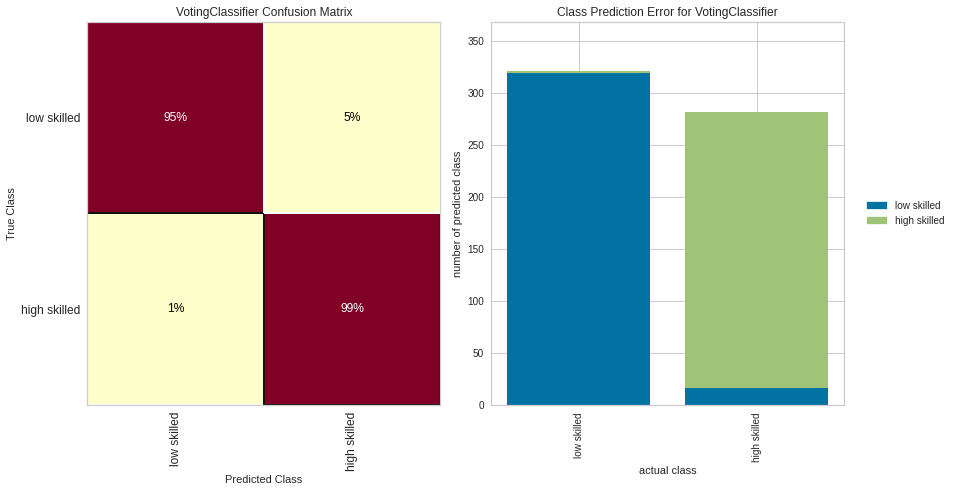

In [125]:
plot_cm_cp(ensemble)

## Comparing the models<a name="compare-models"></a>

In [126]:
for report in train_results:
    model = next(iter(report))
    print(f"\t\t----{model}----")
    print(report[model])

		----Decision Tree----
              precision    recall  f1-score   support

 low skilled       1.00      0.99      0.99      1340
high skilled       0.99      1.00      0.99      1072

    accuracy                           0.99      2412
   macro avg       0.99      0.99      0.99      2412
weighted avg       0.99      0.99      0.99      2412

		----Gaussian Naive Bayes----
              precision    recall  f1-score   support

 low skilled       0.82      0.81      0.82      1340
high skilled       0.77      0.78      0.78      1072

    accuracy                           0.80      2412
   macro avg       0.80      0.80      0.80      2412
weighted avg       0.80      0.80      0.80      2412

		----Random Forest----
              precision    recall  f1-score   support

 low skilled       1.00      1.00      1.00      1340
high skilled       1.00      1.00      1.00      1072

    accuracy                           1.00      2412
   macro avg       1.00      1.00      1.00      

In [127]:
for report in test_results:
    model = next(iter(report))
    print(f"\t\t----{model}----")
    print(report[model])

		----Decision Tree----
              precision    recall  f1-score   support

 low skilled       0.98      0.90      0.94       335
high skilled       0.89      0.98      0.93       268

    accuracy                           0.94       603
   macro avg       0.94      0.94      0.94       603
weighted avg       0.94      0.94      0.94       603

		----Gaussian Naive Bayes----
              precision    recall  f1-score   support

 low skilled       0.79      0.80      0.79       335
high skilled       0.74      0.74      0.74       268

    accuracy                           0.77       603
   macro avg       0.77      0.77      0.77       603
weighted avg       0.77      0.77      0.77       603

		----Random Forest----
              precision    recall  f1-score   support

 low skilled       0.99      0.93      0.96       335
high skilled       0.92      0.99      0.95       268

    accuracy                           0.96       603
   macro avg       0.96      0.96      0.96      

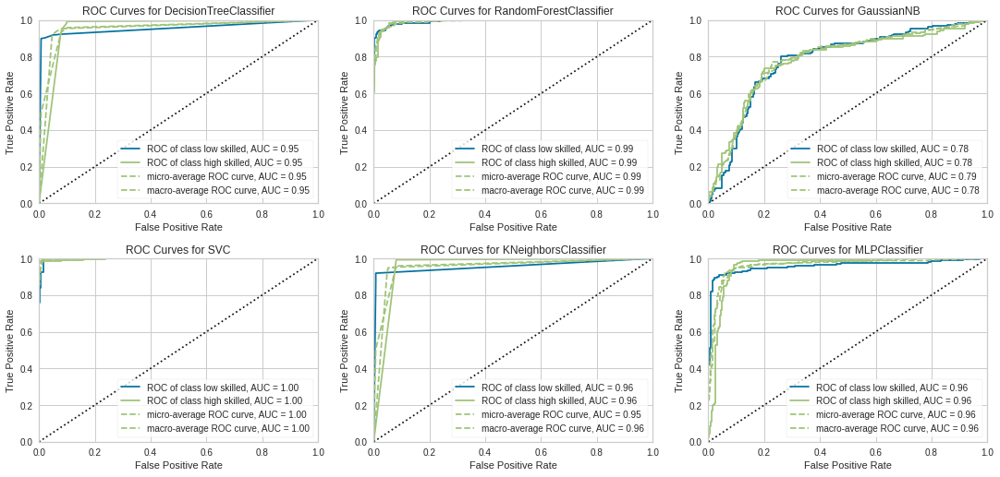

In [135]:
fig, axes = plt.subplots(2, 3, figsize=(15, 7))
axes = axes.flatten()
fig.tight_layout()
fig.subplots_adjust(wspace=0.2, hspace=0.3)


roc_dt = ROCAUC(dt, classes=classes, ax=axes[0])
roc_dt.fit(train_set, train_label)
roc_dt.score(test_set, test_label)
roc_dt.finalize()

roc_rf = ROCAUC(rf, classes=classes, ax=axes[1])
roc_rf.fit(train_set, train_label)
roc_rf.score(test_set, test_label) 
roc_rf.finalize()

roc_gnb = ROCAUC(gnb, classes=classes, ax=axes[2])
roc_gnb.fit(train_set, train_label)
roc_gnb.score(test_set, test_label) 
roc_gnb.finalize()

roc_svm = ROCAUC(svm, classes=classes, ax=axes[3])
roc_svm.fit(train_set, train_label)
roc_svm.score(test_set, test_label) 
roc_svm.finalize()

roc_knn = ROCAUC(knn, classes=classes, ax=axes[4])
roc_knn.fit(train_set, train_label)
roc_knn.score(test_set, test_label)
roc_knn.finalize()

roc_nn = ROCAUC(nn, classes=classes, ax=axes[5])
roc_nn.fit(train_set, train_label)
roc_nn.score(test_set, test_label)
roc_nn.finalize()

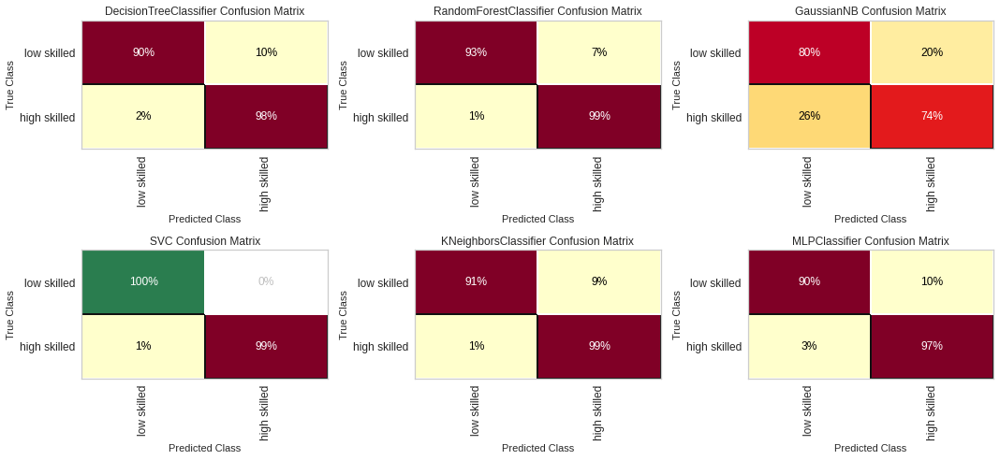

In [136]:
fig, axes = plt.subplots(2, 3, figsize=(15, 7))
axes = axes.flatten()

fig.tight_layout()

cm_vis_dt = ConfusionMatrix(
    dt, classes=classes,
    percent=True,
    ax=axes[0]
)
cm_vis_dt.fit(train_set, train_label)
cm_vis_dt.score(test_set, test_label)
cm_vis_dt.finalize();

cm_vis_rf = ConfusionMatrix(
    rf, classes=classes,
    percent=True,
    ax=axes[1]
)
cm_vis_rf.fit(train_set, train_label)
cm_vis_rf.score(test_set, test_label)
cm_vis_rf.finalize();

cm_vis_gnb = ConfusionMatrix(
    gnb, classes=classes,
    percent=True,
    ax=axes[2]
)
cm_vis_gnb.fit(train_set, train_label)
cm_vis_gnb.score(test_set, test_label)
cm_vis_gnb.finalize();

cm_vis_svm = ConfusionMatrix(
    svm, classes=classes,
    percent=True,
    ax=axes[3]
)
cm_vis_svm.fit(train_set, train_label)
cm_vis_svm.score(test_set, test_label)
cm_vis_svm.finalize();

cm_vis_knn = ConfusionMatrix(
    knn, classes=classes,
    percent=True,
    ax=axes[4]
)
cm_vis_knn.fit(train_set, train_label)
cm_vis_knn.score(test_set, test_label)
cm_vis_knn.finalize();

cm_vis_nn = ConfusionMatrix(
    nn, classes=classes,
    percent=True,
    ax=axes[5]
)
cm_vis_nn.fit(train_set, train_label)
cm_vis_nn.score(test_set, test_label)
cm_vis_nn.finalize();

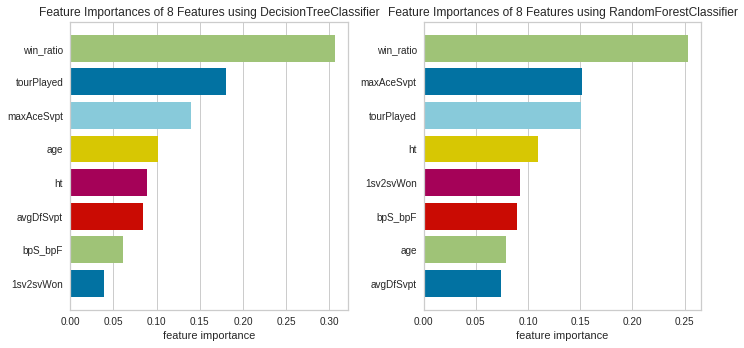

In [133]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes = axes.flatten()

fi_vis_dt = FeatureImportances(dt, relative=False, ax=axes[0])
fi_vis_dt.fit(train_set, train_label)
fi_vis_dt.finalize();

fi_vis_rf = FeatureImportances(rf, relative=False, ax=axes[1])
fi_vis_rf.fit(train_set, train_label)
fi_vis_rf.finalize();

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=bd0371f1-26bc-4fa2-b3a3-1a163a949e34' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>